<a href="https://colab.research.google.com/github/sawao7/DCGAN/blob/main/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **DCGANを用いて顔画像を生成**
### **DCGANとは？**
DCGANの解説をする前にまずGUNの解説をしたい。
GANとは、GANは、DLモデルにトレーニングデータの分布をキャプチャするように教えるためのフレームワークであり、同じ分布から新しいデータを生成できる。
VAEと同じ生成モデルの一種だが、VAEと違う点は、VAEでは確率分布を尤度で明示的に仮定しているのに対して、GANでは暗黙的に確率分布を仮定している。
画像データの場合は、VAEよりもGANのほうが画像が鮮明になる傾向がある。

**では、DCGANとはなんだろうか？**
GANとDCGANの決定的な違いは、GeneratorとDiscriminatorそれぞれのネットワークに全結合層ではなく、畳み込み層(と転置畳み込み層)を使用している点である。DCGANの方がより鮮明な画像が生成できる傾向がある。

### **①必要なライブラリをimportする**

In [ ]:
# pyhon 標準ライブラリ
import os
import random
import zipfile # zipファイルを解凍するためのライブラリ

# 機械学習に必須ライブラリ
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#%matplotlib inline

# pytorch関連
import torch
import torch.nn as nn
import torch.nn.parallel # GPUで並列処理を使えるようにするため
import torch.optim as optim
import torch.utils.data
from torchvision import datasets, transforms, utils # utils make_grid()などを用いて画像を並べて表示したい

## **②データをダウンロード**
今回は、http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html から画像のzipファイルをgoogle driveに保存して、それをcolob上で解凍することにする。(端末の容量がないため、手元のpcで解凍することは避けた)

In [ ]:
# zipファイルを解凍
with zipfile.ZipFile("/content/drive/MyDrive/img_align_celeba.zip") as existing_zip:
    # dataディレクトリの中に保存する
    existing_zip.extractall('data/')

## **③各種パラメータの設定**

In [ ]:
dataroot = "/content/data" # データセットフォルダへのパス
batch_size = 128 # バッチサイズ
image_size = 64 # 画像のサイズ
nc = 3 # カラーチャンネル(カラー画像の場合は3)
nz = 100 # 潜在ベクトルの長さ
ngf = 64 # 特徴マップの深さに関係する
ndf = 64 # 特徴マップの深さに家計する
epochs = 5 # イテレータの回数
lr = 0.0002 # 学習率
transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])
device = "cuda" # デバイスをGPUに設定
ngpu = 1 # 使用可能なgpuの数 (もし0ならcpuで実行するようにする)

## **④データセット・データローダーの作成**


In [ ]:
# データセットを作成
dataset = datasets.ImageFolder(
      root=dataroot,
      transform=transform
)
# 上記のデータセットをもとに、データローダーを作成
dataloader = torch.utils.data.DataLoader(
      dataset,
      batch_size=batch_size,
      shuffle=True, # データをシャッフルするか
      num_workers=2 # データをロードするためのワーカースレッドの数
)

In [ ]:

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)




# Create the generator
netG = Generator(ngpu).to(device)

# # Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


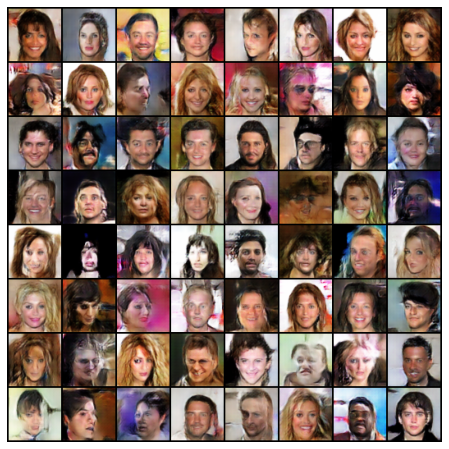

In [ ]:
#%%capture
import matplotlib.animation as animation
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
from IPython.display import HTML
ani.save('hoge.mp4')
HTML(ani.to_jshtml())

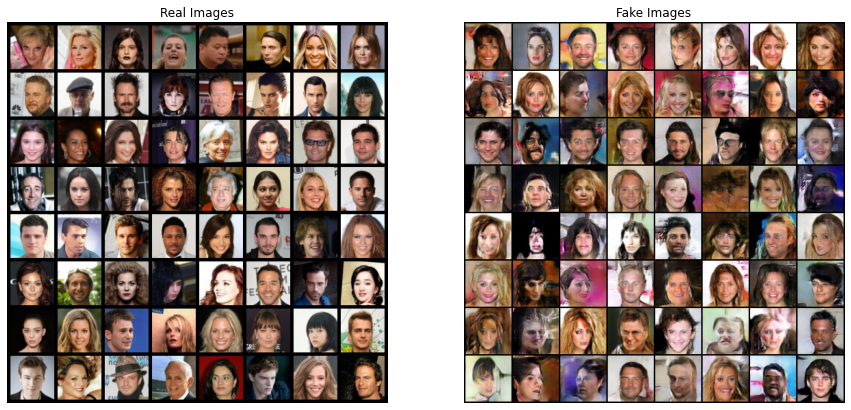

<class 'torch.Tensor'>


TypeError: ignored

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(utils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()
print(type(np.transpose(img_list[-1],(1,2,0))))
plt.imshow(img_list[-1[0]])

In [ ]:
print(len(img_list[-1][0]))

530


### サンプル画像を表示

128


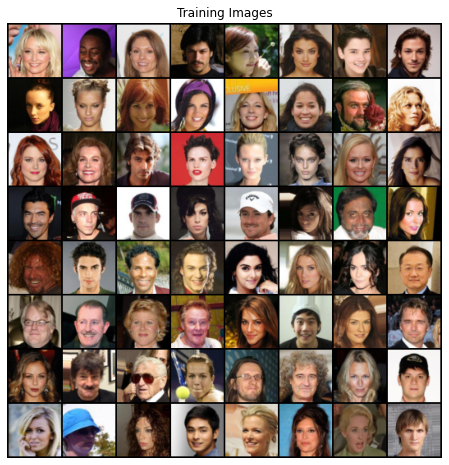

In [ ]:
# dataloaderをイテレータに変換してnext()関数で要素を取り出している(つまりreal_batchは要素一つ一つが入ったリスト)
# バッチサイズごとに区切られているため、画像はバッチサイズの枚数描画される
real_batch = next(iter(dataloader))
# キャンパスを描画(真っ白)
plt.figure(figsize=(8, 8))
# 軸を失くす
plt.axis("off")
# タイトルをつける
plt.title("Training Images")
print(len(real_batch[0]))
# 画像を表示 np.transposeで行列の転置を行っており、normalizeは正規化している。cpu()で処理をcpuに切り替えている
plt.imshow(np.transpose(utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## **④DCGANの実装**
主な流れは以下のとおりである


1.   重みの初期化をする関数を定義
2.   画像を生成するジェネレータークラスの作成
3.   画像が本物かを確かめるディスクリミネータクラスの作成
4.   損失関数と最適化関数の実装と導入
5.   学習
6.   モデルの評価



#### **重みの初期化をする関数を定義**

In [ ]:
def weight_init(model):
    classname = model.__class__.__name__
    # クラス名にConv(畳み込み層)があったら
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    # クラス名にBatchNorm(バッチ正規化)があったら
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

#### **ジェネレータークラス**

In [ ]:
# nn.Moduleクラスを継承
class Generator(nn.Module):
    # 初期の処理
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        # nn.Sequential()でモデルを作成
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

        def forward(self, input):
            return self.main(input)

# ジェネレーターを作成し、gpuに設定
netG = Generator(ngpu).to(device)

# 重みの初期化をする関数を適用
#  平均=0, 標準偏差=0.02になるように設定
netG.apply(weight_init)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

#### **ディスクリミネータクラス**

In [ ]:
# ほぼGeneraterクラスと変わらないが、Discriminatorは活性化関数にLeakyRelu関数やsigmoid関数を使っていたりする
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
  
# ディスクリミネータを作成し、gpuに設定
netD = Discriminator(ngpu).to(device)

# 重みの初期化をする関数を適用
#  平均=0, 標準偏差=0.02になるように設定
netD.apply(weight_init)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

以上で、生成器であるGeneratorと、Generatorが生成した画像が本物かどうか識別するDiscriminatorのモデルが完成した。

#### **損失関数・最適化関数の導入**

In [ ]:
# 今回は、損失関数にバイナリクロスエントロピー損失（BCELoss）関数を用いることとする。
criterion = nn.BCELoss()

# ジェネレータの進行を視覚化するために使用する潜在ベクトルを作成
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# ジェネレーターとディスクリミネータの損失を計算する時に正誤のラベルが必要なため、定義
real_label = 1. # 本物 1(.)ピリオドを横に打った理由は、小数として扱いたいから
fake_label = 0. # 偽物

# G と D に Adam(最適化関数)を設定する(論文で推奨されているため)
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

#### **いよいよ学習**

In [ ]:
# 進行状況を追跡するためのリスト
iters = 0
# 学習を重ねるごとの、生成画像をアニメーションで表示したい
img_list = []


# イテレータ(epochs)をループ
for epoch in range(epochs):
    # データローダからバッチごとにループ
    for i, data in enumerate(dataloader, 0):
        # 最初にDiscriminatorの更新をする
        # 具体的には、log(D(x)) + log(1 - D(G(z))) を最大化させる
        
        netD.zero_grad() # 勾配の初期化
        # バッチのフォーマット
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # 実在の写真でdiscriminatorを順伝播させる
        output = netD(real_cpu).view(-1)
        # 損失を計算
        errD_real = criterion(output, label)
        # 逆伝播でdiscriminatorの勾配を算出
        errD_real.backward()
        D_x = output.mean().item()
        
        # ※上記のは本物の画像を用いて学習している。ここからは偽物の画像を用いて学習
        # 潜在ベクトルを作成
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generatorで偽の画像を生成する
        fake = netG(noise)
        # 偽物のラベルを指定
        label.fill_(fake_label)
        # Generaorで生成した偽物の画像をDiscriminatorで分類
        output = netD(fake.detach().view(-1))  # view(-1)でサイズを自動調整
        # 損失を計算
        errD_fake = criterion(output, label)
        # 逆伝播でdiscriminatorの勾配を計算(本物の画像の時と同じ)
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # 正誤両方の画像の損失の合計
        errD = errD_real + errD_fake
        # 最適化関数を更新
        optimizerD.step()

        # 次にGeneratorの更新をする
        # 具体的には、log(D(G(z)))を最大化させる
        # ※ほとんどDiscriminatorと同じ
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()

        optimizerG.step()

        # 学習の進行を出力
        # [今のイテレータの回数/全体のイテレータの回数] Discriminatorの損失 Generatorの損失 リアル
        if i % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

NotImplementedError: ignored